# 1. Import modules and load MERFISH data 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=150, dpi_save=300, frameon=False, figsize=(3,3), fontsize=7.5, facecolor='white')

# 2. Load MERLin analysis results

In [2]:
merlin_output_folder = r'\\franklin\SSD_01\MERFISH_Analysis\20221109-hM1_hM1'
#merlin_output_folder = r'I:\MERFISH_Analysis\20221026-hM1_hM1'
# generate post-analysis folders
postanalysis_folder = os.path.join(merlin_output_folder, 'PostAnalysis')
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Create postanalysis_folder: \\franklin\SSD_01\MERFISH_Analysis\20221109-hM1_hM1\PostAnalysis


In [3]:
figure_folder = os.path.join(postanalysis_folder, 'Figures')
if not os.path.exists(figure_folder):
    print(f"Create figure_folder: {figure_folder}")
    os.makedirs(figure_folder)
else:
    print(f"Use figure_folder: {figure_folder}")

sc.settings.figdir = figure_folder

Create figure_folder: \\franklin\SSD_01\MERFISH_Analysis\20221109-hM1_hM1\PostAnalysis\Figures


## Load metadata

In [4]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,100090091402736678888197489131611034598,0,624.849027,-3342.302095,1477.544025,-3346.794895,-3337.809294,1472.889225,1482.198825
1,10732625793029140123424755257210125909,0,785.968766,-3436.964097,1612.490028,-3443.346897,-3430.581297,1607.565228,1617.414829
2,108039200357829034373096809120089628536,0,89.665372,-3303.368094,1521.824026,-3305.538894,-3301.197293,1519.329226,1524.318826
3,124891598484788705734668408601801104749,0,36.994711,-3437.450097,1526.198026,-3439.674897,-3435.225297,1524.297226,1528.098826
4,125255261883123867662021027737348411759,0,242.419573,-3284.090093,1648.076029,-3287.070893,-3281.109293,1644.393229,1651.758829
...,...,...,...,...,...,...,...,...,...
26138,82790355933718300364575690703595098661,500,410.367185,-3571.725889,1736.142028,-3576.164689,-3567.287089,1730.947228,1741.336829
26139,90708150793142851334666036123750037891,500,80.924486,-3588.033889,1696.884027,-3590.096689,-3585.971089,1694.119227,1699.648828
26140,93427965552656182868239451093613308919,500,395.002430,-3639.873891,1721.238028,-3643.772691,-3635.975090,1717.123228,1725.352828
26141,97276028622069451112957431202788755795,500,597.179627,-3500.937287,1754.394029,-3504.560687,-3497.313887,1749.739229,1759.048829


In [5]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')

In [6]:
# remove blanks
blanks = [_c for _c in df.columns if 'Blank-' in _c]
df = df.drop(columns=blanks)

adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

df

C:\Users\puzheng_new\AppData\Local\Temp\2\ipykernel_19332\3737320187.py:5: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = anndata.AnnData(df)


,CD52,PTPRU,MARCKSL1,RSPO1,POU3F1,RAB3B,ROR1,PTGER3,SLC44A5,ST6GALNAC5,...,SYNE2,IFI27,CDH11,ZFHX3,VAT1L,EPN2,NPTX1,ZNF536,KIAA1755,PCDH11X
index,,,,,,,,,,,,,,,,,,,,,
100090091402736678888197489131611034598,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
10732625793029140123424755257210125909,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
108039200357829034373096809120089628536,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
124891598484788705734668408601801104749,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
125255261883123867662021027737348411759,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82790355933718300364575690703595098661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
90708150793142851334666036123750037891,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
93427965552656182868239451093613308919,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 4. Preprocess and filter the MERFISH data 

In [7]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

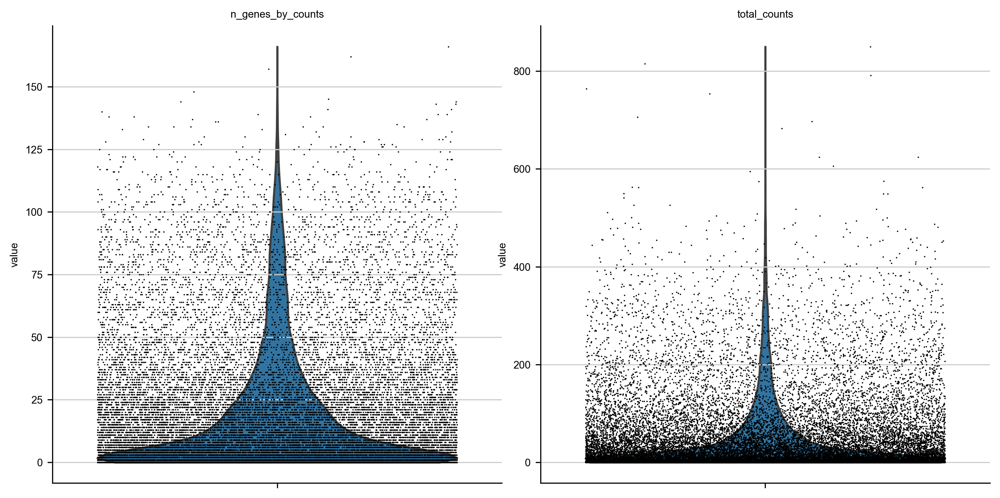

In [8]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

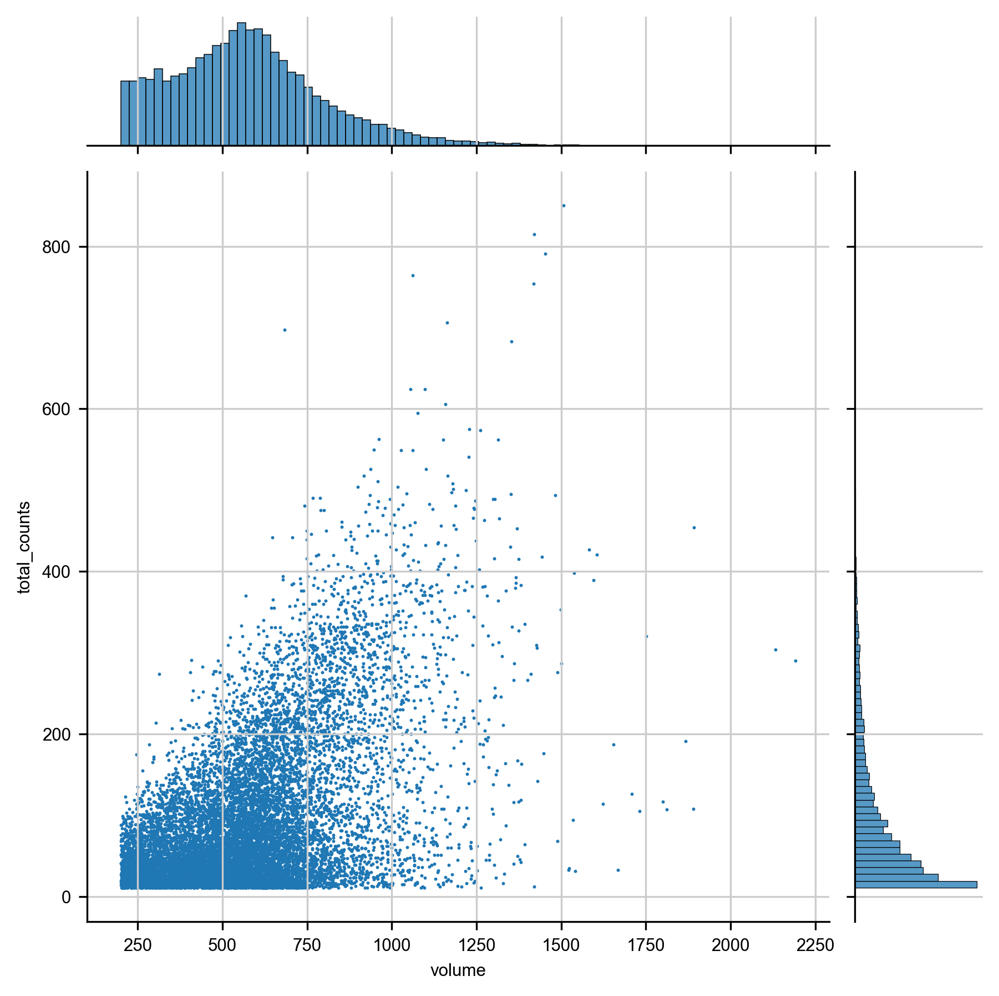

In [12]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts', s=2, linewidth=0)

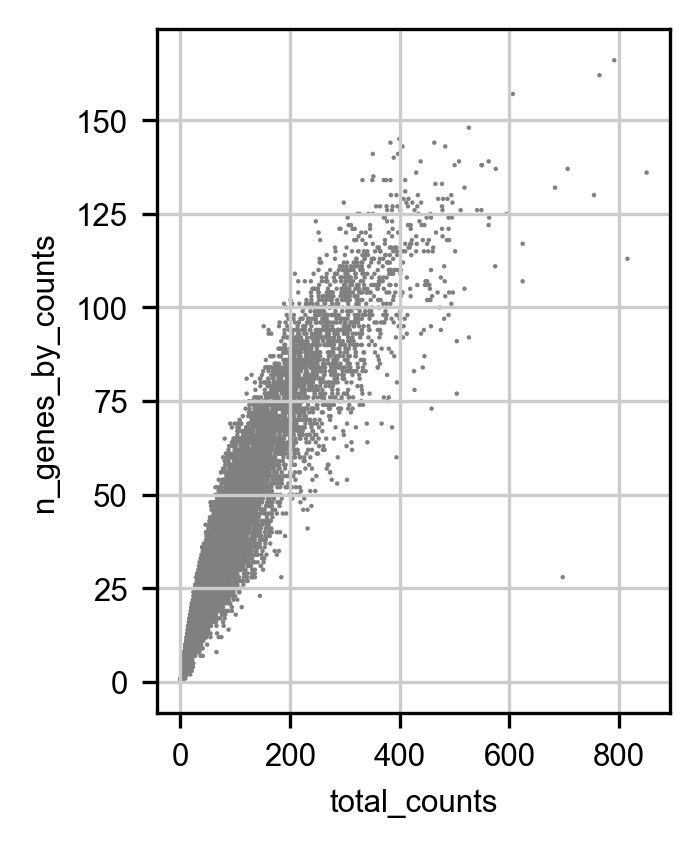

In [10]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [11]:
gene_count_threshold = 5
total_count_threshold = 10
volume_threshold = 200
volume_upper_threshold = 6000
# Filtering
adata = adata[adata.obs['n_genes_by_counts'] > gene_count_threshold]
adata = adata[adata.obs['total_counts'] > total_count_threshold]
adata = adata[adata.obs['volume'] > volume_threshold]
adata = adata[adata.obs['volume'] <= volume_upper_threshold]

print(len(adata) / len(cell_meta_data) , len(adata))

0.47224878552576216 12346


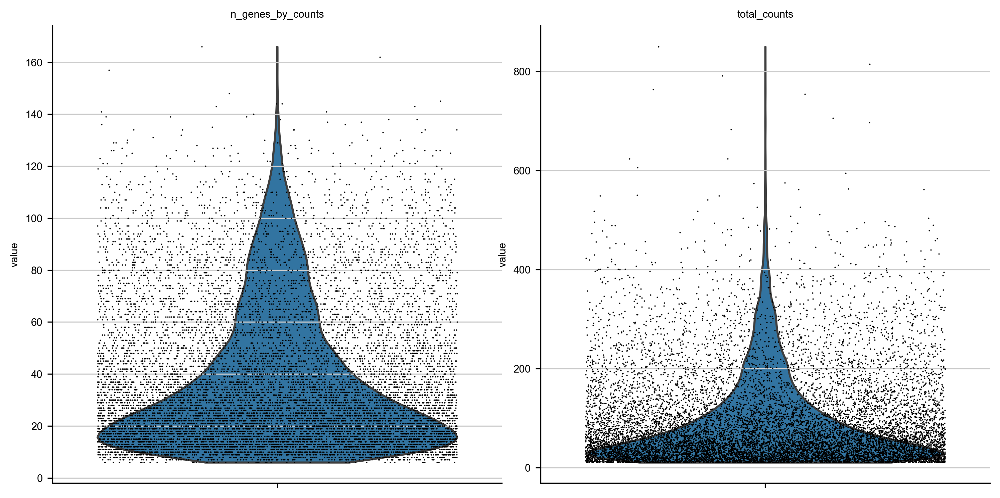

In [13]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix

# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True, save='_after_filter_counts.png')

In [14]:
# plot mean count
adata.obs['total_counts'].median()

61.0

## 4. PCA and UMAP of the MERFISH data (for quick test)

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


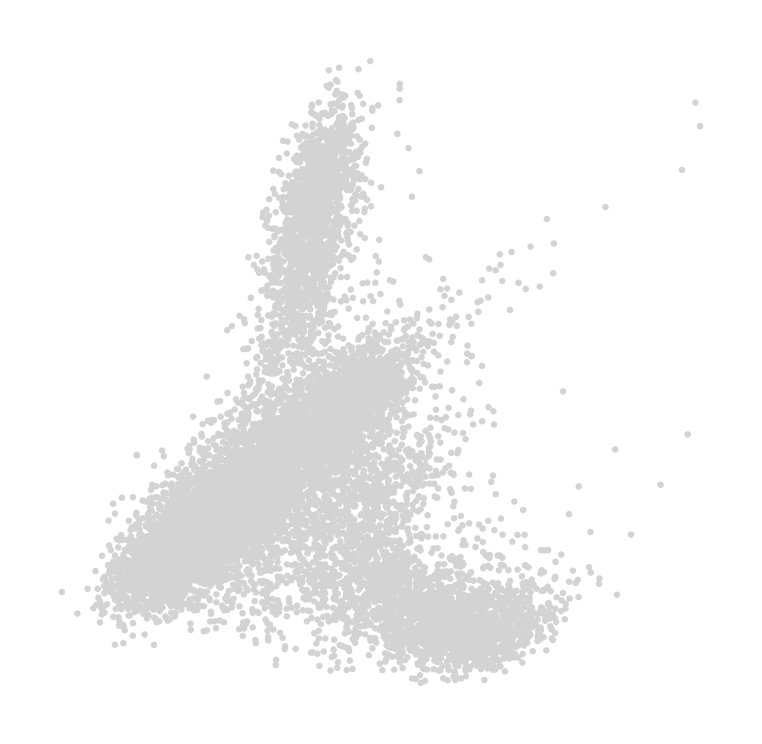

Wall time: 16.2 s


In [15]:
%%time
# Total-count normalize (library-size correct) the data matrix to 100 counts per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [16]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)

Wall time: 27.4 s


In [17]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=1)

Wall time: 765 ms


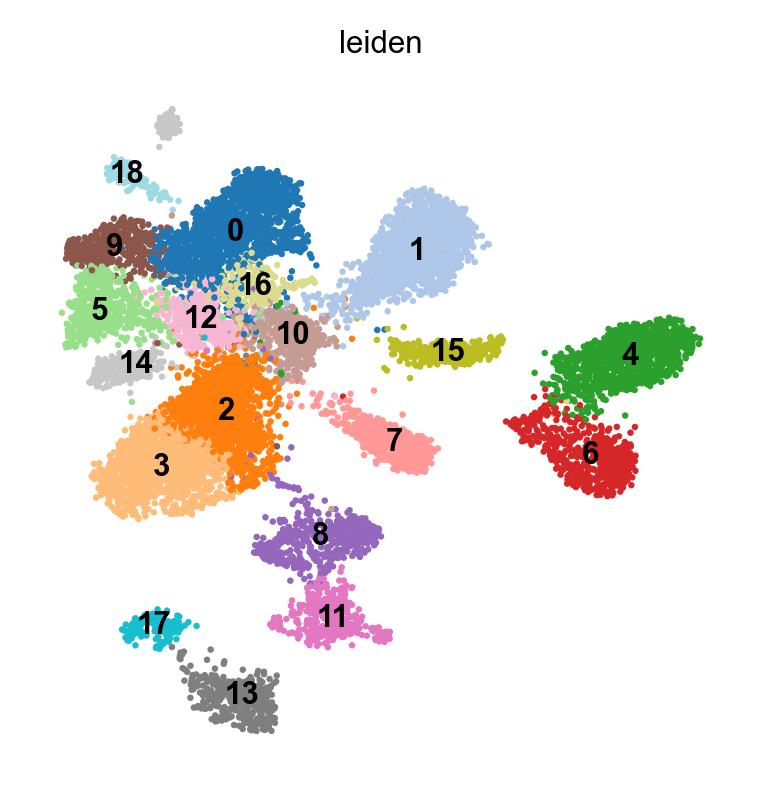

Wall time: 10.8 s


In [18]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', 
           legend_loc='on data',
           palette='tab20',
           save='_cluster.png',
           )

## 5. Check count for each cell for genes of interest

In [19]:
# direcly use previous leiden
adata.obs['leiden_cluster'] = adata.obs.leiden

## T-test to identify marker genes

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2

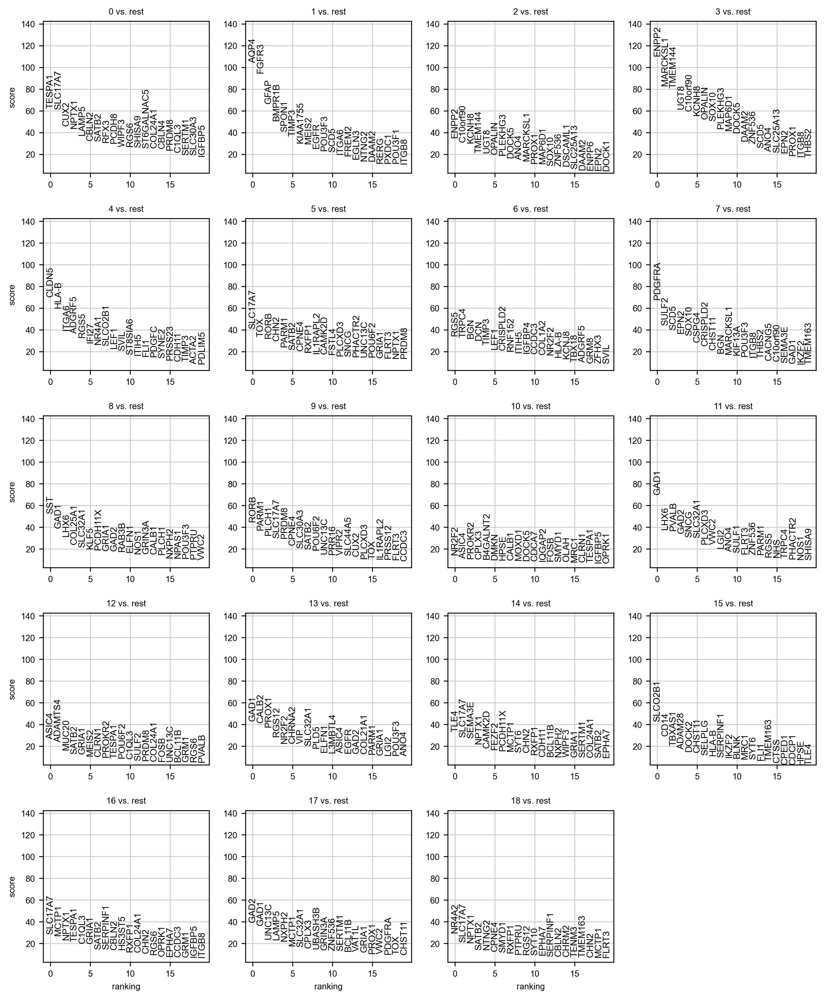

In [20]:
sc.tl.rank_genes_groups(adata, groupby='leiden_cluster', method='t-test')
sc.pl.rank_genes_groups(adata, groupby='leiden_cluster')

In [21]:
gene_ordering = np.array([list(_gnames) for _gnames in adata.uns['rank_genes_groups']['names']])

In [22]:
# assign clusters
clusters = np.sort(np.unique(adata.obs['leiden_cluster']).astype(np.int32))

# Inhibitory
inhibitory_clusters = []
for _i in clusters:
    if np.where(gene_ordering[:,_i]=='SLC32A1')[0] < 20:
        print(_i, end=', ')
        inhibitory_clusters.append(_i)
# excitatory
print("")
excitatory_clusters = []
for _i in clusters:
    if np.where(gene_ordering[:,_i]=='SLC17A7')[0] < 20:
        print(_i, end=', ')
        excitatory_clusters.append(_i)
nonneuron_clusters = []
for _i in clusters:
    if _i not in inhibitory_clusters and _i not in excitatory_clusters:
        nonneuron_clusters.append(_i)

8, 11, 13, 17, 
0, 5, 9, 14, 16, 18, 

In [23]:
gene_ordering[:15, 2]

array(['ENPP2', 'C10orf90', 'KCNH8', 'TMEM144', 'UGT8', 'OPALIN',
       'PLEKHG3', 'DOCK5', 'ANO4', 'MARCKSL1', 'PROX1', 'MAP6D1', 'SOX10',
       'ZNF536', 'DSCAML1'], dtype='<U10')

In [24]:
gene_ordering[:10, 1]

array(['AQP4', 'FGFR3', 'GFAP', 'BMPR1B', 'SPON1', 'TIMP3', 'KIAA1755',
       'MEIS2', 'EGFR', 'POU3F3'], dtype='<U10')

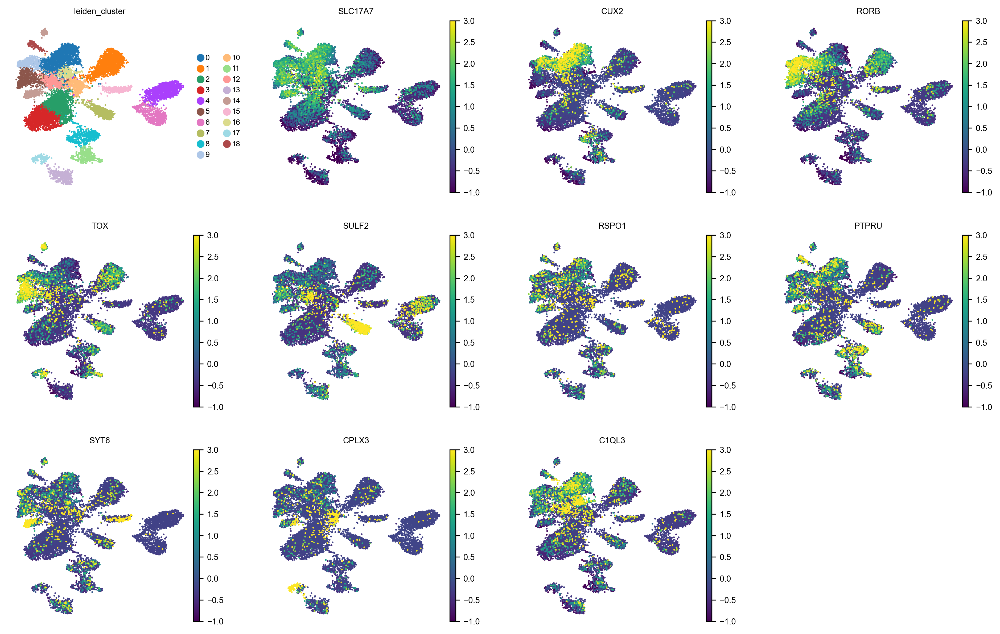

In [25]:
sc.pl.umap(adata, color=['leiden_cluster', 'SLC17A7','CUX2','RORB', 'TOX', 'SULF2', 'RSPO1','PTPRU','SYT6', 'CPLX3', 'C1QL3'],
           vmin=-1, vmax=3, save='_excitatory_gene.png')

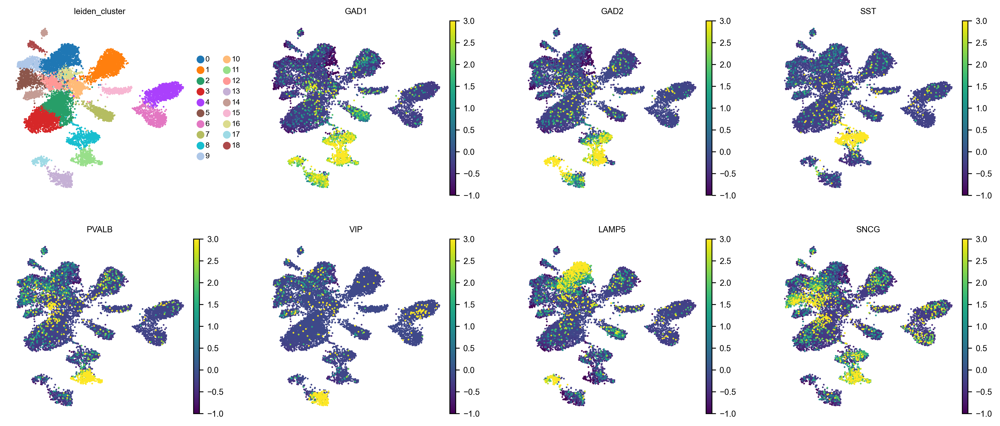

In [26]:
sc.pl.umap(adata, color=['leiden_cluster', 'GAD1','GAD2','SST','PVALB','VIP','LAMP5','SNCG'],
           vmin=-1, vmax=3, save='_inhibitory_gene.png')

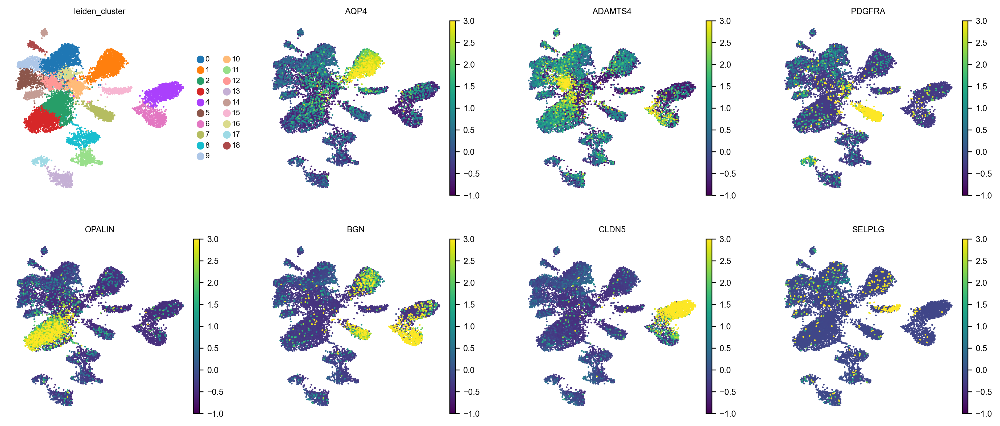

In [27]:
sc.pl.umap(adata, color=['leiden_cluster', 'AQP4', 'ADAMTS4', 'PDGFRA', 'OPALIN', 'BGN', 'CLDN5', 'SELPLG',],
           vmin=-1, vmax=3, save='_nonneuron_gene.png')

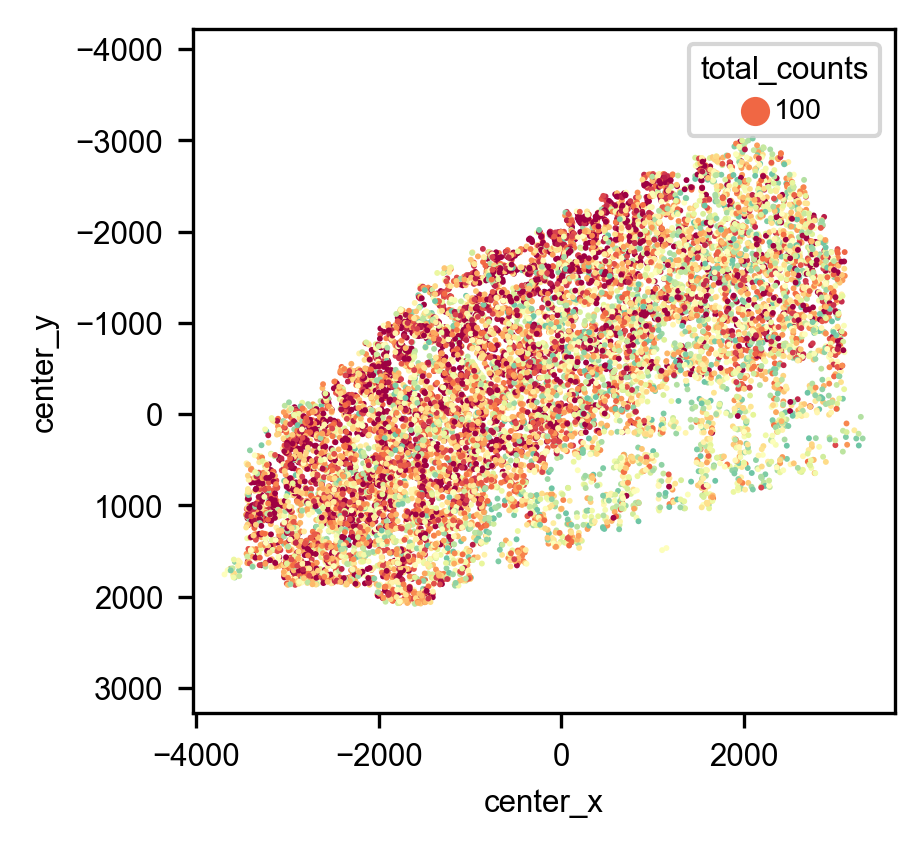

In [28]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
#plt.style.use('dark_background')
ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                     hue='total_counts', hue_norm=LogNorm(vmin=5,vmax=200), 
                     palette='Spectral_r',
                     s=2, linewidth=0,
                     legend=True, )
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
#ax.legend(hs,ls, ncol=8, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, 'spatial-total_counts.png'), transparent=True)
plt.show()

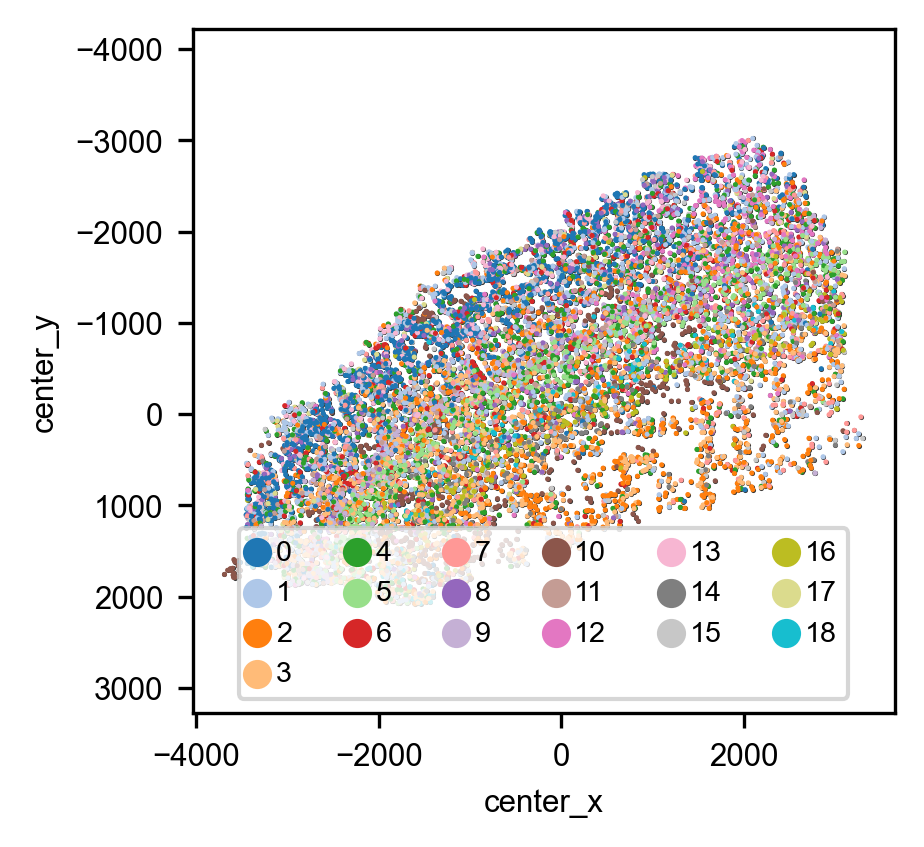

In [29]:
import matplotlib.pyplot as plt
# visualzie the spatial dist for clusters
#sel_clusters = ['0', '1', '2', '3', '4', '5']
sel_clusters = np.unique(adata.obs['leiden'])

sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden']) if _cls in sel_clusters]
ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.2,0.2,0.2], s=1.5, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden', s=1.5, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=6, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, 'spatial-all_clusters.png'), transparent=True)
plt.show()

# 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

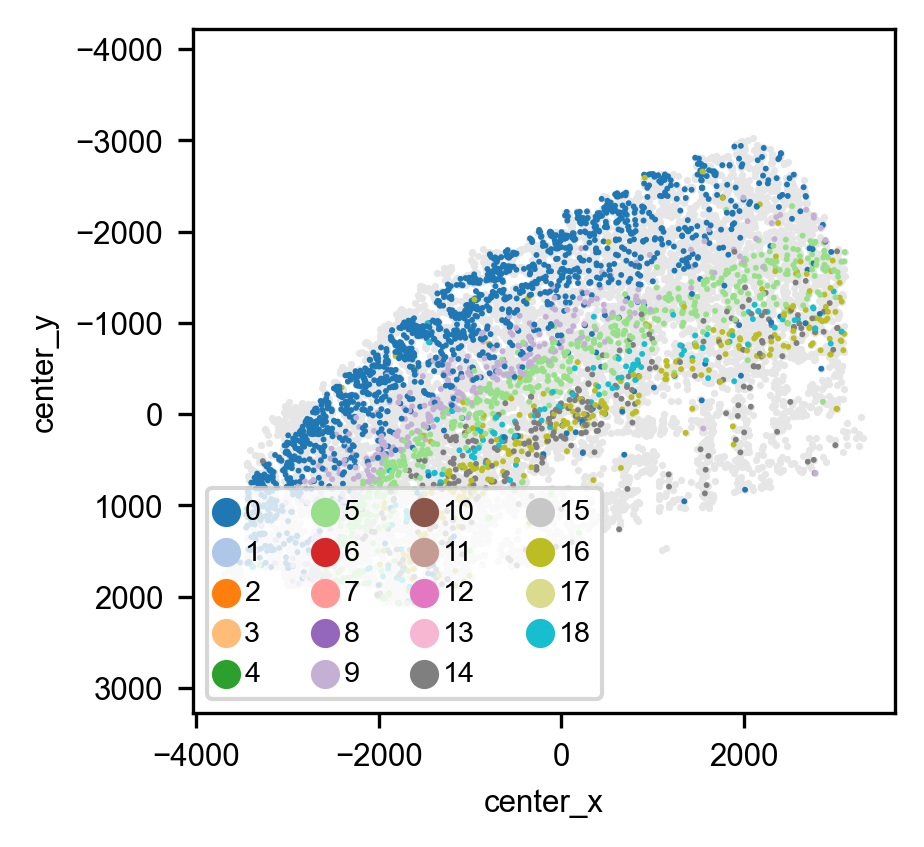

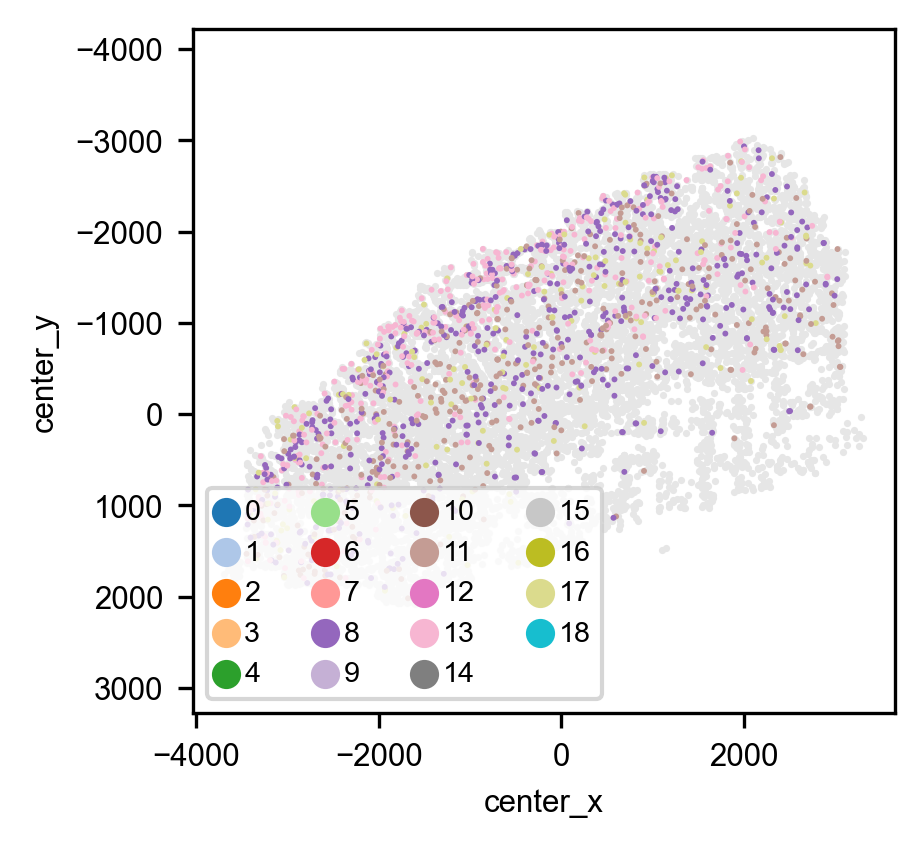

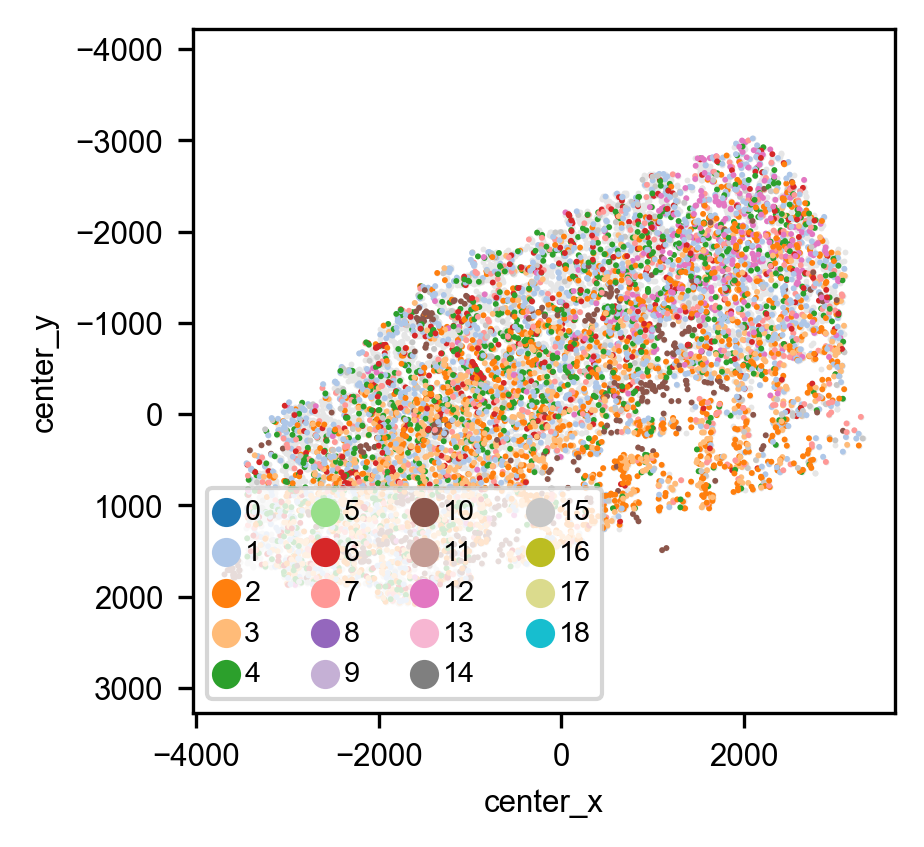

In [30]:
# visualzie the spatial dist for clusters

sel_clusters = [str(_cls) for _cls in excitatory_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.9,0.9,0.9], s=3, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=4, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_excitatory_clusters.png'), transparent=True)
plt.show()


sel_clusters = [str(_cls) for _cls in inhibitory_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.9,0.9,0.9], s=3, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=4, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_inhibitory_clusters.png'), transparent=True)
plt.show()


sel_clusters = [str(_cls) for _cls in nonneuron_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.9,0.9,0.9], s=2., legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2., legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=4, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_nonneuron_clusters.png'), transparent=True)
plt.show()

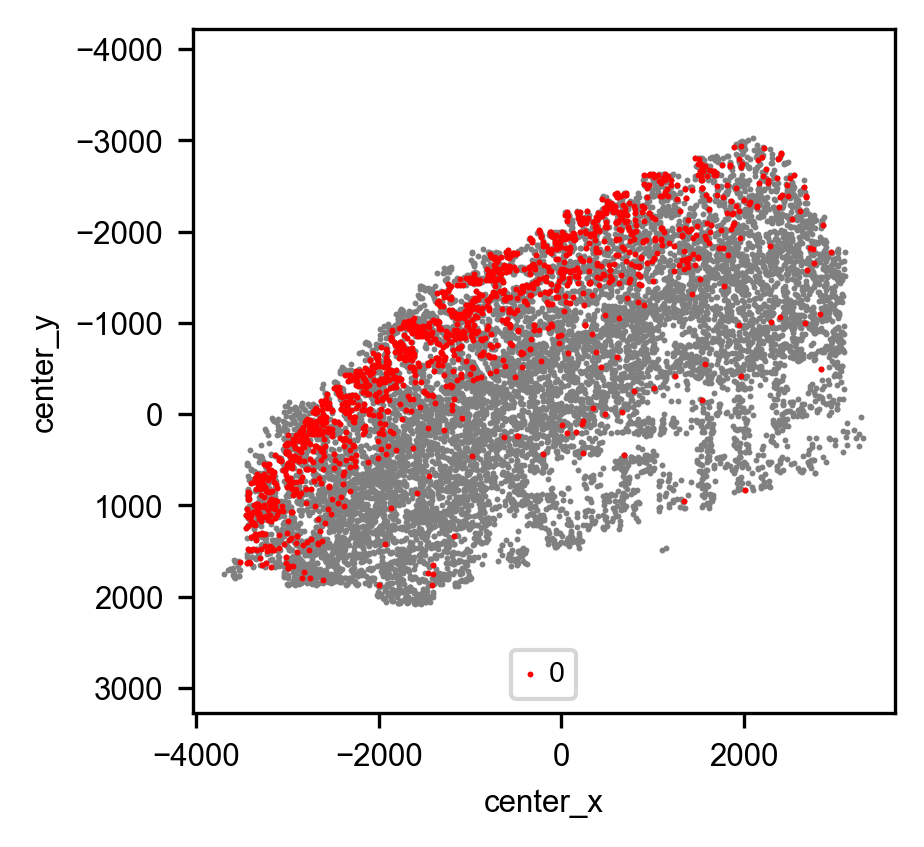

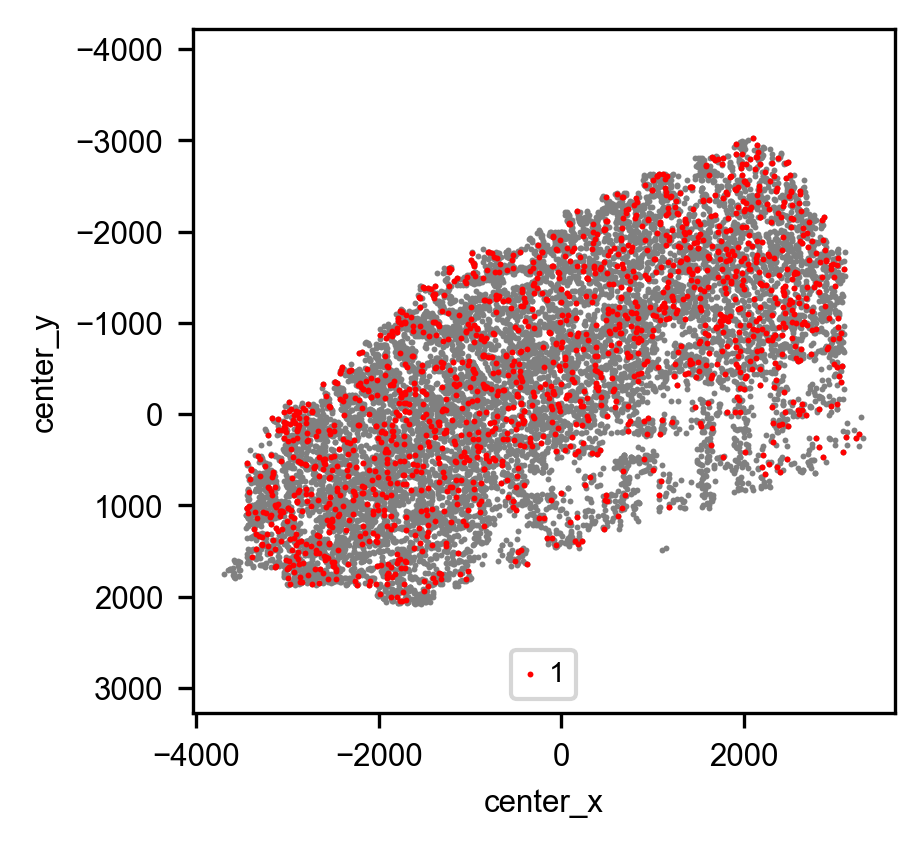

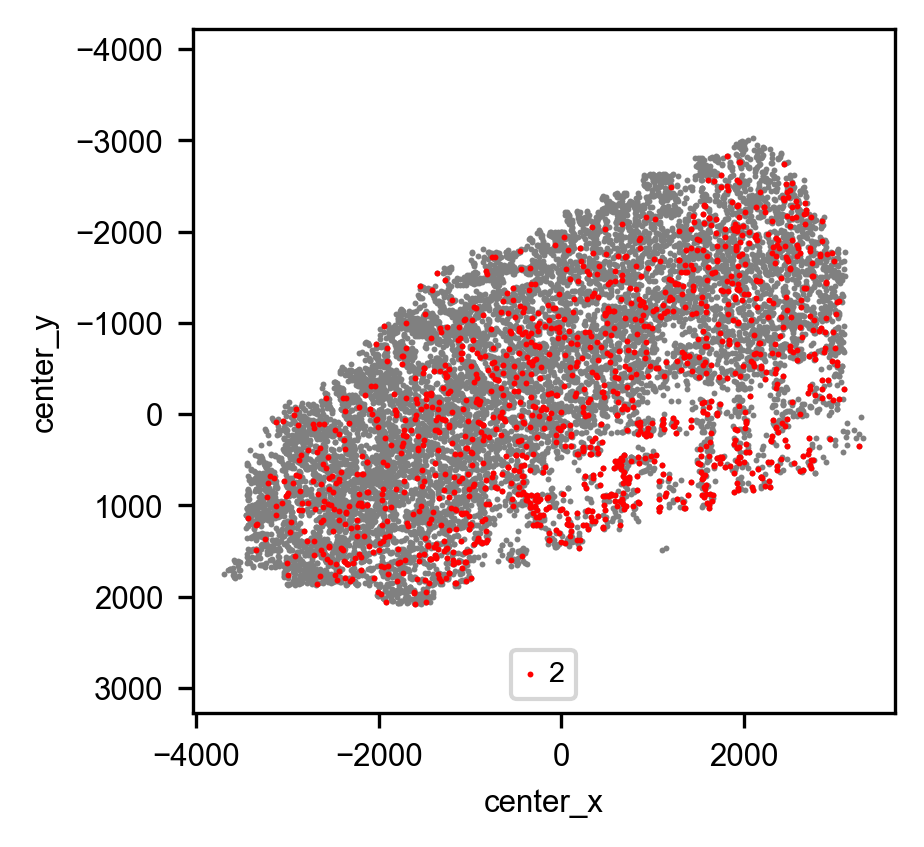

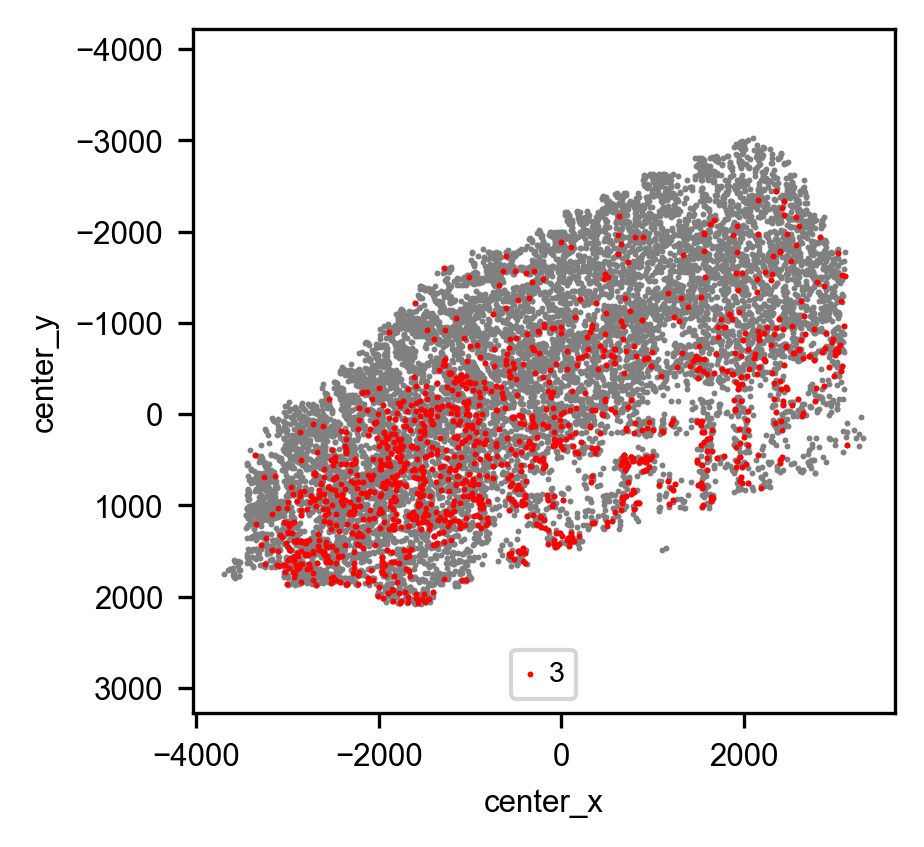

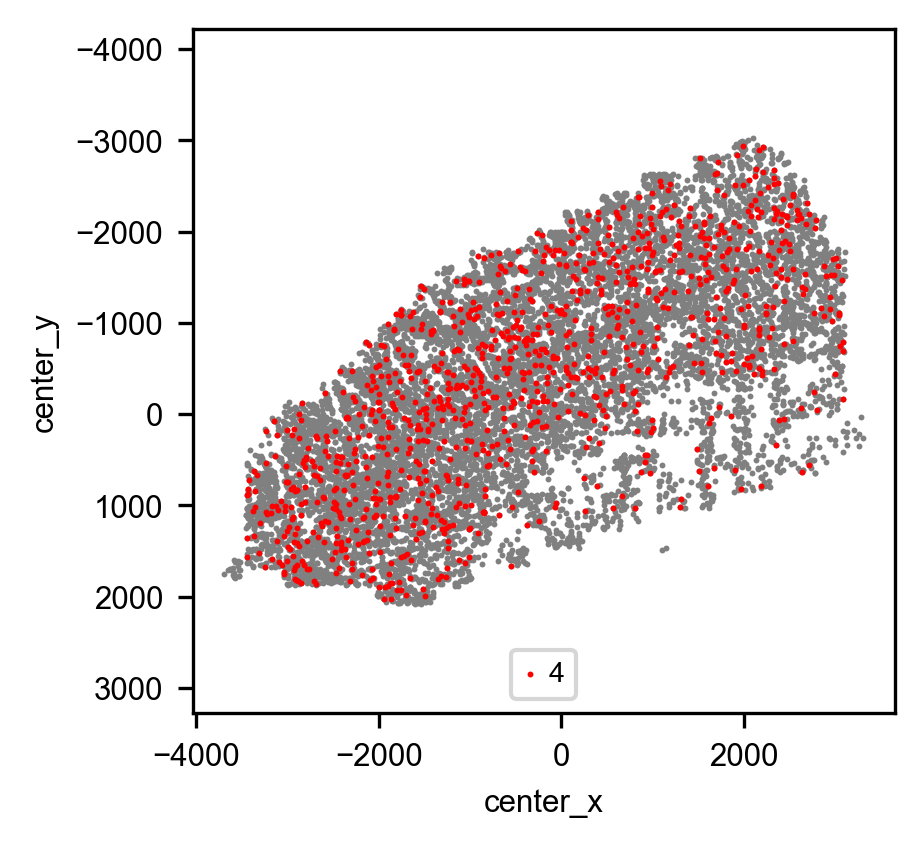

...

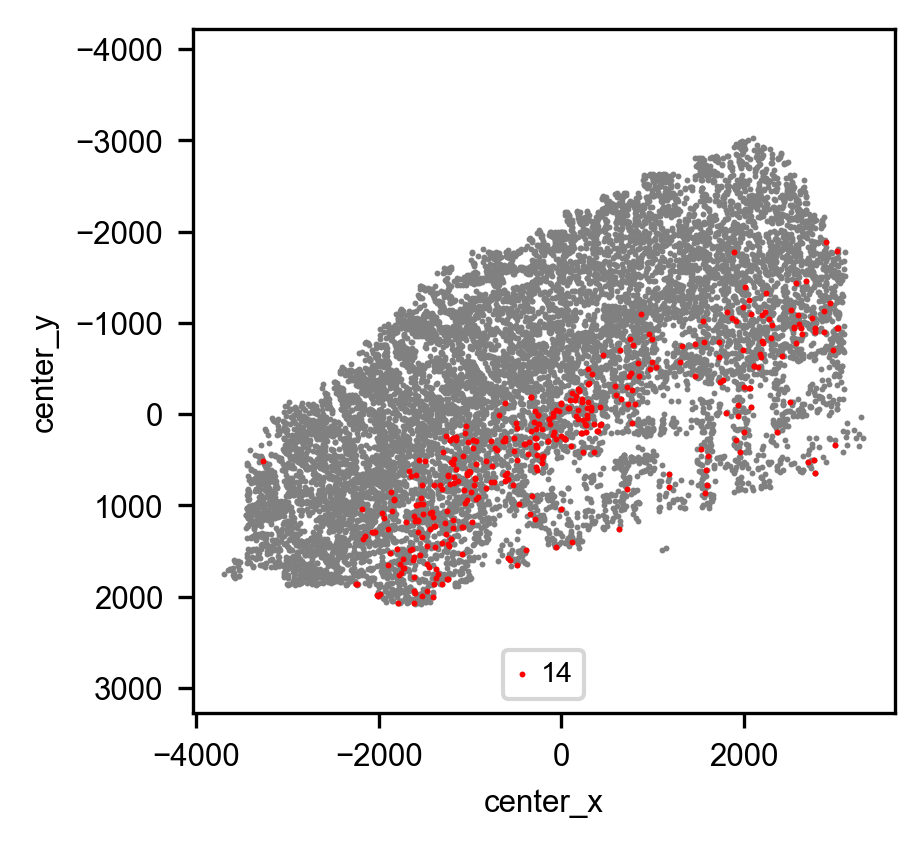

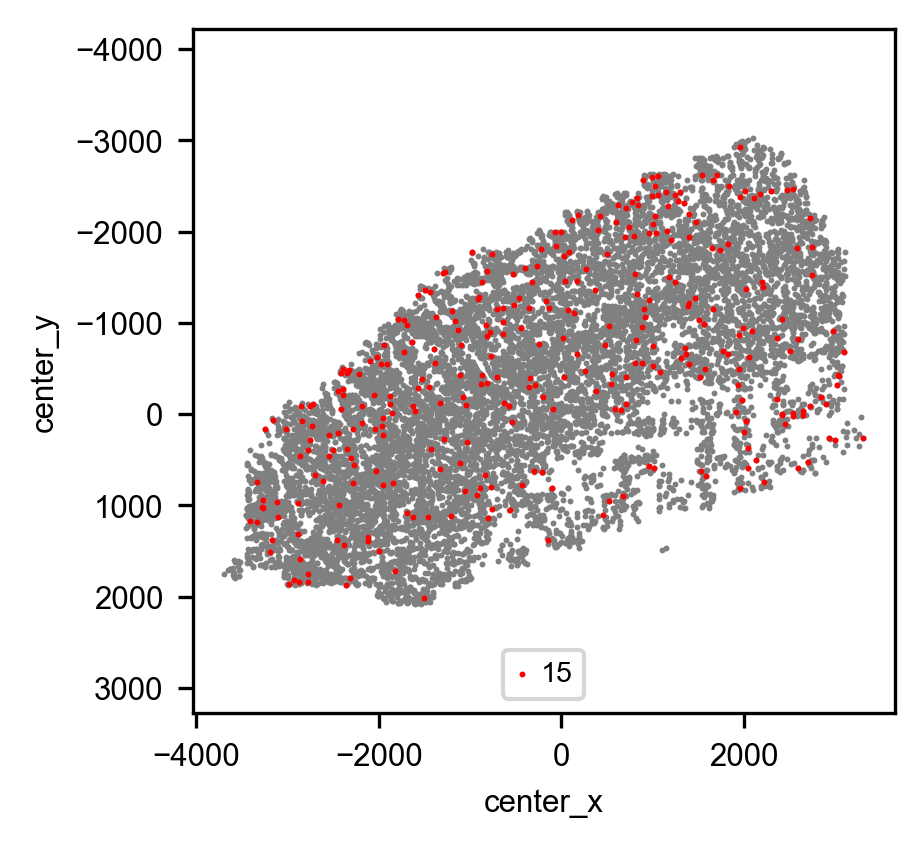

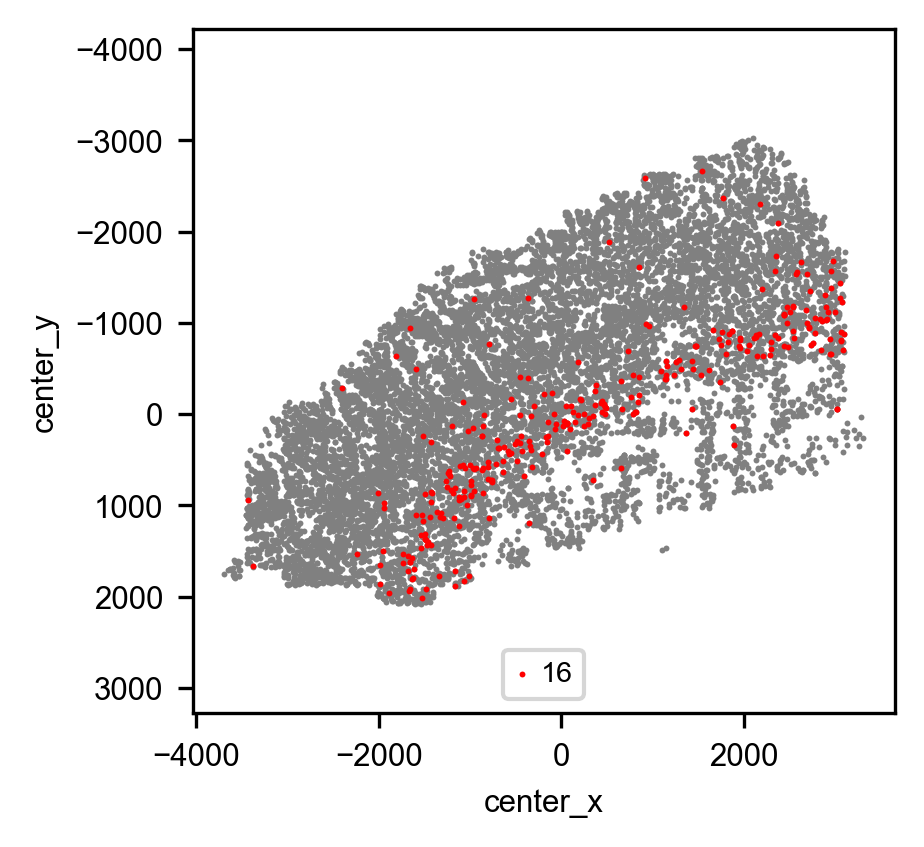

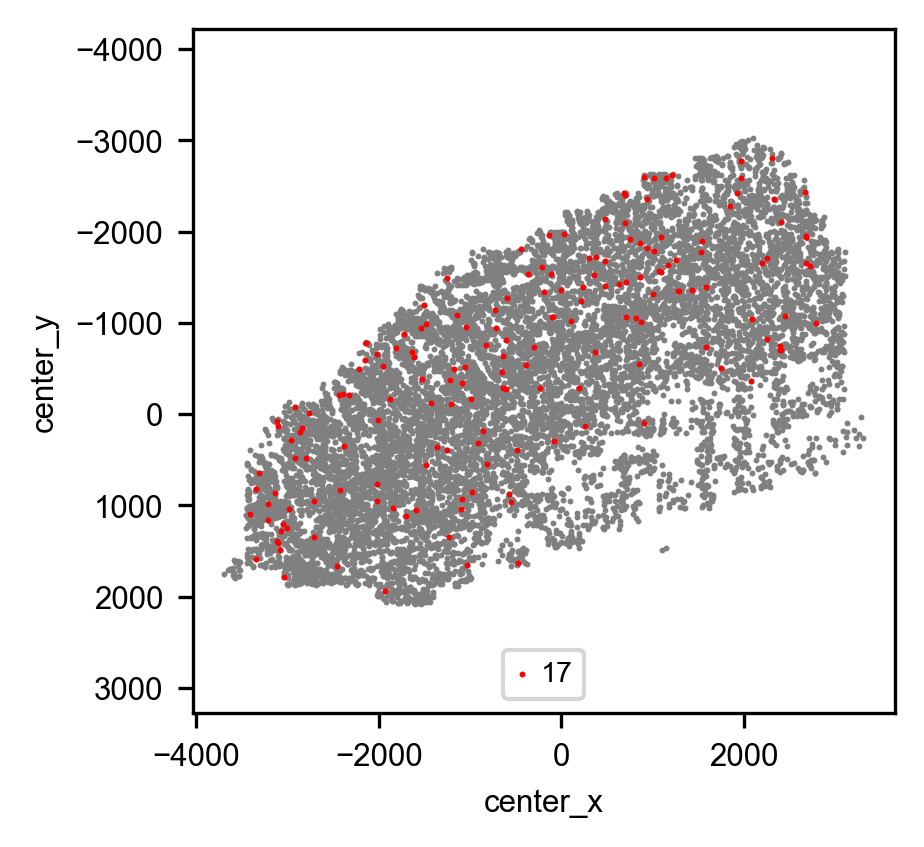

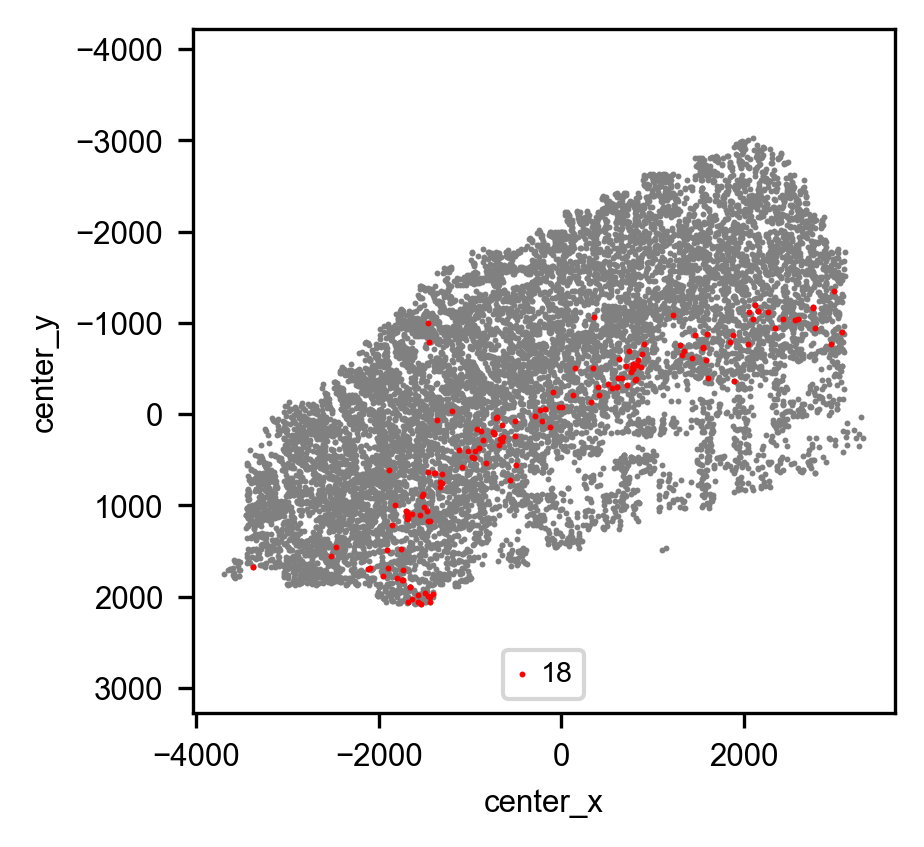

In [31]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
for _class in sorted(np.unique(adata.obs['leiden_cluster']), key=lambda v:int(v)):
    #plt.style.use('dark_background')
    ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                    color='grey', s=2, legend=True, linewidth=0)
    ax = sns.scatterplot(data=adata.obs.loc[adata.obs['leiden_cluster']==_class], 
                         x='center_x', y='center_y', 
                    color='r', s=2, legend=True, label=_class, linewidth=0)
    ax.grid(False)
    ax.invert_yaxis()
    plt.axis('equal')
    hs, ls = ax.get_legend_handles_labels()
    ax.legend(hs,ls, ncol=8, loc=8)
    plt.show()

# 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [32]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = True

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: \\franklin\SSD_01\MERFISH_Analysis\20221109-hM1_hM1\PostAnalysis\filtered_cluster_data.h5ad
